In [ ]:
pip install obspy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.5/14.5 MB 76.8 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unrar x -Y "/content/drive/MyDrive/dataset/Data new.rar" "/content/data/"


UNRAR 5.61 beta 1 freeware      Copyright (c) 1993-2018 Alexander Roshal


Extracting from /content/drive/MyDrive/dataset/Data new.rar

Creating    /content/data                                             OK
Creating    /content/data/Data                                        OK
Creating    /content/data/Data/ap                                     OK
Extracting  /content/data/Data/ap/verynewc-0001-ap-42.VG.MEPAS.00.HHZ.2021.017       0%  OK 
Extracting  /content/data/Data/ap/verynewc-0002-ap-53.VG.MEPAS.00.HHZ.2021.027       0%  OK 
Extracting  /content/data/Data/ap/verynewc-0003-ap-57.VG.MEPAS.00.HHZ.2021.063       0%  OK 
Creating    /content/data/Data/dg                                     OK
Extracting  /content/data/Data/dg/verynewc-0001-dg-56.VG.MEPAS.00.HHZ.2020.317       0%  OK 
Extracting  /content/data/Data/dg/verynewc-0002-dg-54.VG.MEPAS.00.HHZ.2021.001       0%  OK 
Extracting  /content/data/Data/dg/verynewc-0003-dg-51.VG.MEPA

DEKLARASI VARIABEL

In [ ]:
import matplotlib as mpl

import os, glob
import numpy as np
import matplotlib.pyplot as plt

import scipy.signal as signal
import scipy.io
from obspy import read



#deklarasi variabel
variable = {      'label' : ['ap','dg','low frequency', 'multiple phase','rockfall', 'tremor', 'vt-a', 'vt-b'],
                  'nfft'    : 256*.5,
                  'nx'      : 99,
                  'ny'      :  65,
                  'duration'  : 102.4,
                  'threshold': 0.5,
                  'length': 100,
                  'showPlot' : True,
            }

data_dir = "/content/data/Data"
file_seismic = "seismic.mat"

#variabel spectogram
dSpec = { 'mSpec'   : np.array([]),
          'file'    : [],
          'delta_t' : float(),
          'nx'      : int(),
          'ny'      : int(),
          }

print( 'label :', list(enumerate( variable['label'])))

jumlah = 0
for i, kategori in enumerate( variable['label']):
    files = glob.glob( f"{data_dir}/{kategori}/*")
    jumlah += len( files)

print( 'jumlah file :', jumlah)



label : [(0, 'ap'), (1, 'dg'), (2, 'low frequency'), (3, 'multiple phase'), (4, 'rockfall'), (5, 'tremor'), (6, 'vt-a'), (7, 'vt-b')]
jumlah file : 2023


In [ ]:
st = read(f"{data_dir}/{kategori}/*")
print(st[0].stats)


         network: VG
         station: MEPAS
        location: 00
         channel: HHZ
       starttime: 2020-12-08T10:05:17.100000Z
         endtime: 2020-12-08T10:05:27.090000Z
   sampling_rate: 100.0
           delta: 0.01
            npts: 1000
           calib: 1.0
         _format: MSEED
           mseed: AttribDict({'dataquality': 'D', 'number_of_records': 2, 'encoding': 'FLOAT64', 'byteorder': '>', 'record_length': 4096, 'filesize': 8192})


In [ ]:
#@title Hide
print(st[0].data)

[ 3.73454236e-01  5.98105180e-01  6.73055271e-01  5.73939678e-01
  3.21534563e-01 -2.03376244e-02 -3.68667732e-01 -6.29345474e-01
 -7.45469990e-01 -6.97882044e-01 -5.08587289e-01 -2.33421805e-01
  6.88988798e-02  3.48164805e-01  5.73491554e-01  7.33412606e-01
  8.28754303e-01  8.67382763e-01  8.60117012e-01  8.13252587e-01
  7.29755118e-01  6.08682519e-01  4.47488634e-01  2.52392035e-01
  3.92044628e-02 -1.65609022e-01 -3.23857097e-01 -4.02970085e-01
 -3.77640835e-01 -2.53740301e-01 -6.44575254e-02  1.40298574e-01
  2.99141144e-01  3.75203838e-01  3.64027833e-01  2.91540090e-01
  2.05843863e-01  1.38986263e-01  1.09613518e-01  9.41716195e-02
  5.01457590e-02 -6.46355501e-02 -2.66260041e-01 -5.36372905e-01
 -8.17024563e-01 -1.03125647e+00 -1.10920034e+00 -1.01708192e+00
 -7.60216933e-01 -3.82707584e-01  5.23927138e-02  4.79716518e-01
  8.45753503e-01  1.11222406e+00  1.24837215e+00  1.23481837e+00
  1.07303740e+00  7.85656901e-01  4.22883101e-01  5.31985356e-02
 -2.62696452e-01 -4.79750

PREPROCESSING DATA

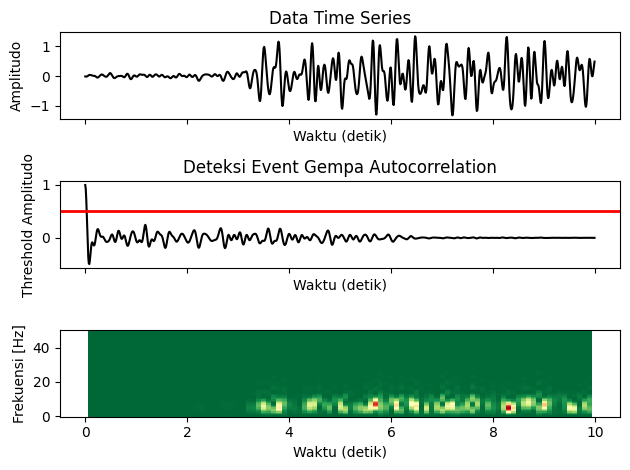

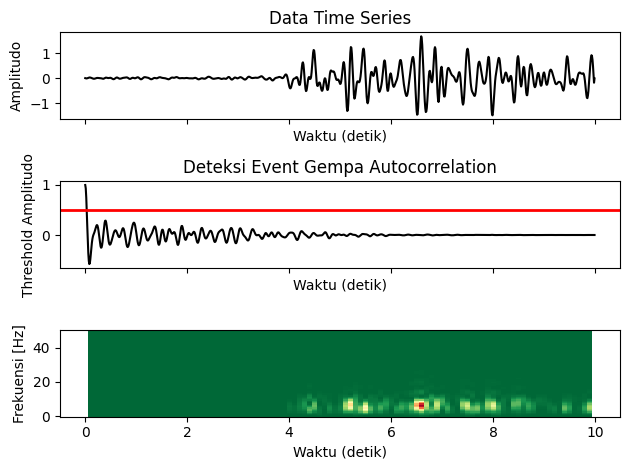

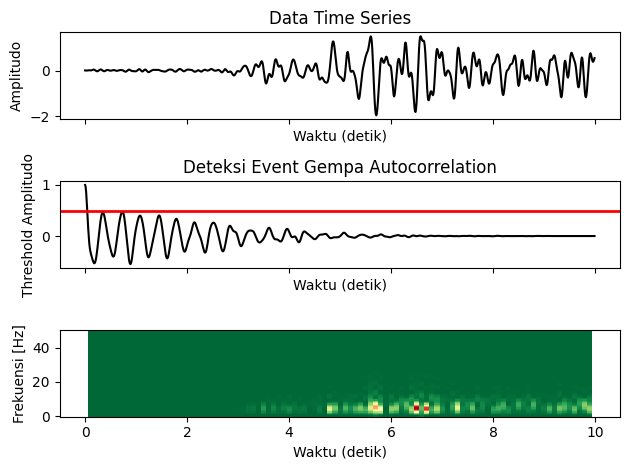

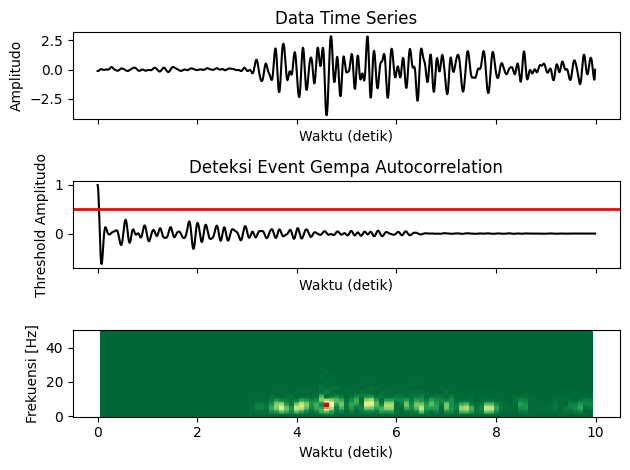

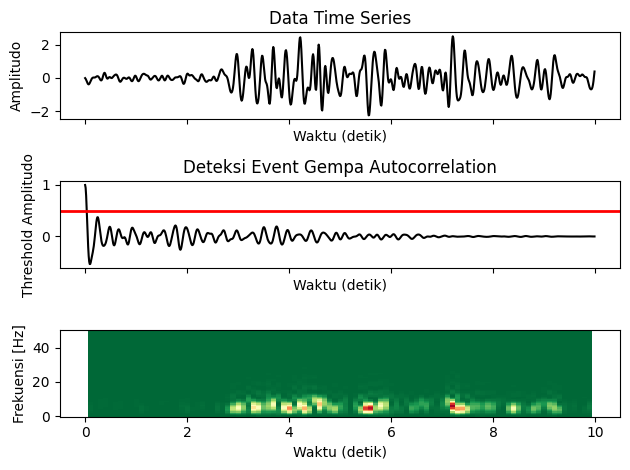

...

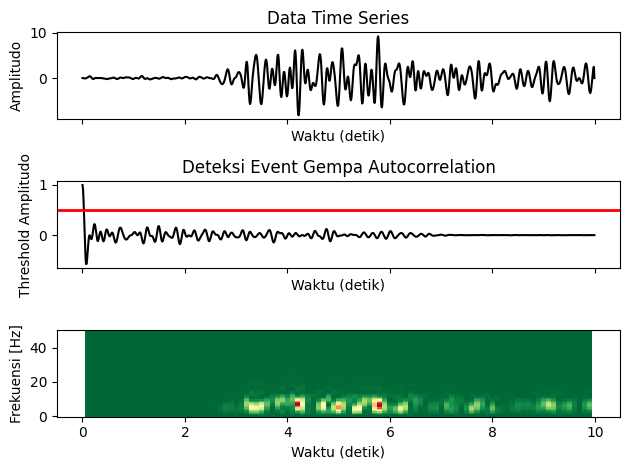

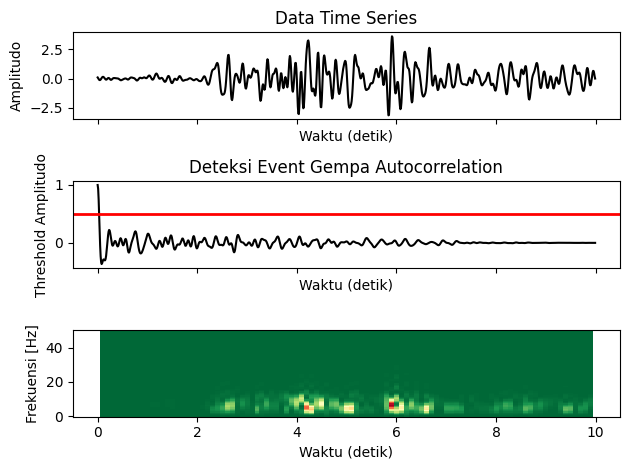

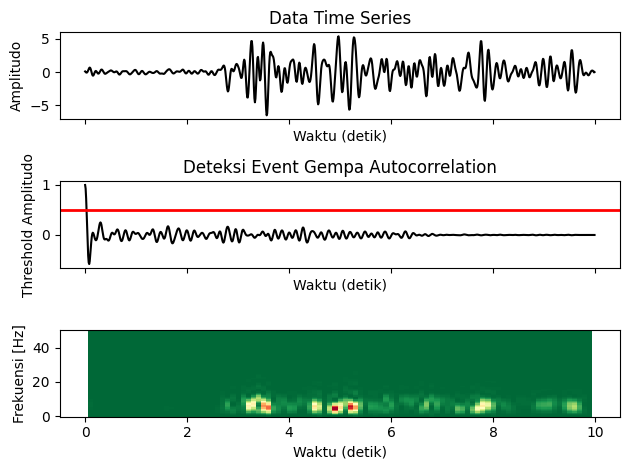

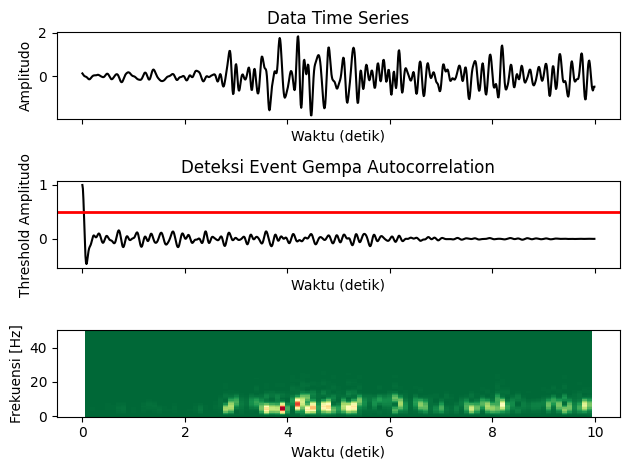

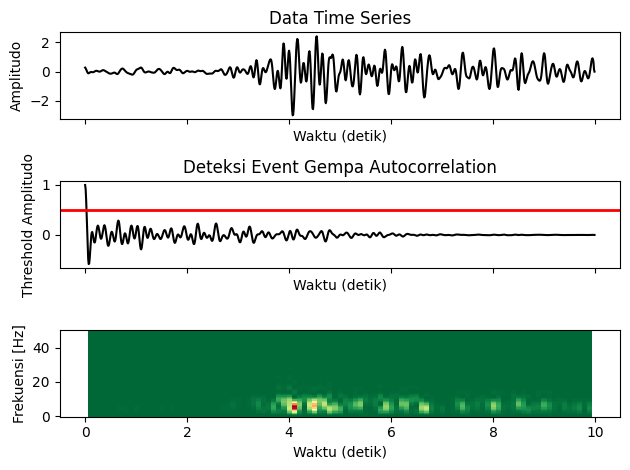

In [ ]:
# inisialisasi array
dSpec['mSpec'] = np.zeros((variable['nx']*variable['ny']+1, jumlah+1), dtype=float)
iteration_a_spec = 0
show_plot = 10
for i, kategori in enumerate(variable['label']):
    files = glob.glob(f"{data_dir}/{kategori}/*")
    for i_file, current_file in enumerate(files):
        current_basename = os.path.basename(current_file)
        # read
        SEIS = read(current_file)

        t = SEIS[0].stats.starttime #waktu awal event
        delta_t = SEIS[0].stats.delta #besar event
        thresh_corr = 0.5

        #detrend data time series untuk meringkas nilai dari suatu data
        SEIS[0].detrend('linear')

        #ubah data ke bentuk autocorrelation
        autocorr = np.correlate(SEIS[0].data, SEIS[0].data, mode='full')
        autocorr = autocorr[len(autocorr)//2:]
        autocorr /= np.max(autocorr)

        #menentukan panjang setiap segment
        nperseg = int(.02*SEIS[0].stats.npts) #menentukan nilai dari sample

        #ubah data ke bentuk spectogram
        data, a_t, point = signal.spectrogram(SEIS[0].data, int(1. / delta_t),
                                              scaling='spectrum',
                                              nfft=variable['nfft'],
                                              nperseg=nperseg,
                                              noverlap=int(.5 * nperseg))


        # menyimpan nilai spektogram
        if i_file == 0 and kategori == variable['label'][0]:
            point_y,point_x = point.shape
            dSpec['a_f']     = data
            dSpec['a_t']     = a_t
            dSpec['nx']      = point_x
            dSpec['ny']      = point_y
            dSpec['delta_t'] = delta_t

        #array 2D to 1D => 2D
        a_spec = point.flatten()
        point = a_spec.reshape(65,99)

        #perintah ploting grafik
        if variable['showPlot'] == True and iteration_a_spec <= show_plot:
            fig, ax = plt.subplots(3, 1, sharex=True)
            ax[0].plot(SEIS[0].times(), SEIS[0].data, "k")

            ax[0].set_xlabel("Waktu (detik)")
            ax[0].set_ylabel("Amplitudo")
            ax[0].set_title("Data Time Series")

            # plot = ax[1].pcolormesh(a_t, data, point,
            #                          shading = 'nearest',

            #                          cmap = plt.cm.RdYlGn_r,
            #                          )
            ax[1].plot(SEIS[0].times(), autocorr, "k")
            ax[1].axhline(thresh_corr, color="r", lw=2)
            ax[1].set_xlabel("Waktu (detik)")
            ax[1].set_ylabel("Threshold Amplitudo")
            ax[1].set_title("Deteksi Event Gempa Autocorrelation")

            plot = ax[2].pcolormesh(a_t, data, point,
                                     shading = 'nearest',

                                     cmap = plt.cm.RdYlGn_r,
                                     )
            ax[2].set_xlabel("Waktu (detik)")
            ax[2].set_ylabel("Frekuensi [Hz]")


            fig.tight_layout()
            plt.show()

            if np.max(autocorr) > variable['threshold']:
                print("Terjadi gempa")
            else:
                print("Tidak terjadi gempa atau terjadi gempa dengan amplitudo kecil.")

        a_spec = point.flatten()
        # Labeling Data
        if kategori == 'ap':
            label = 0
        if kategori == 'dg':
            label = 1
        elif kategori == 'low frequency':
            label = 2
        elif kategori == 'multiple phase':
            label = 3
        elif kategori == 'rockfall':
            label = 4
        elif kategori == 'tremor':
            label = 5
        elif kategori == 'vt-a':
            label = 6
        elif kategori == 'vt-b':
            label = 7

        # add to matrix spektogram with label
        a_spec = np.hstack((a_spec, label))
        dSpec['mSpec'][:,iteration_a_spec] = a_spec
        iteration_a_spec += 1


dSpec['mSpec'] = dSpec['mSpec'].T

scipy.io.savemat(f"{data_dir}/{file_seismic}", dSpec, do_compression=True)

LOAD DATA

In [ ]:
# Load data
import joblib
import scipy.io
data_dir = "/content/data/Data"
file_seismic = "seismic.mat"
data = scipy.io.loadmat(f"{data_dir}/{file_seismic}")
X = data['mSpec'][:,:-1]
y = data['mSpec'][:,-1]

# standarize data
np.random.seed(123)

a_ran_int = np.random.randint(0, len(y)-1, len(y))
X     = X[a_ran_int]
y     = y[a_ran_int]

shape_X  = X.shape[0]

for i in range(shape_X):
    X[i] = (X[i] - X[i].mean())/X[i].std()
    print("Data ke", i+1)
    print(X[i])


PEMBAGIAN DATA

In [ ]:
# Split data into training and test sets
import joblib
X, y = joblib.load('/content/drive/MyDrive/dataset/random_data.pkl')
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=200)

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix
accuracy_test = accuracy_score(y_test, poly)

print(f"Accuracy Test: {accuracy_test}")
print(f"Loss Test: {(1 - accuracy_test)}")


KERNEL LINEAR

UJI PARAMETER LINEAR

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

# Definisikan daftar C values
c_values = [0.001, 0.01, 0.1, 1, 10, 100]

# best_c = None
# best_accuracy = 0
# best_support_vectors_count = None

# Loop over each C value
for c in c_values:
    # Membuat objek SVC dengan kernel linear dan C yang diambil dari daftar C values
    svm_linear = SVC(kernel='linear', C=c)

    # Training model SVM
    svm_linear.fit(X_train, y_train)

    # Lakukan prediksi dengan model yang telah dilatih
    y_pred = svm_linear.predict(X_test)

    # Evaluasi performa model
    accuracy = accuracy_score(y_test, y_pred)

    # # Jika ini adalah akurasi tertinggi yang ditemukan sejauh ini,
    # # simpan parameter C terbaik, akurasi tertinggi, dan jumlah support vector tiap kelas
    # if accuracy > best_accuracy:
    #     best_accuracy = accuracy
    #     best_c = c
    #     best_support_vectors_count = svm_linear.n_support_

    # Print hasil evaluasi performa model
    print("Linear dengan C =", c, " memiliki akurasi sebesar ", accuracy)


# print("Parameter C terbaik:", best_c)

# print("Jumlah support vector tiap kelas dari parameter C terbaik:")
# print(best_support_vectors_count)


Linear dengan C = 0.001  memiliki akurasi sebesar  0.8817733990147784
Linear dengan C = 0.01  memiliki akurasi sebesar  0.9014778325123153
Linear dengan C = 0.1  memiliki akurasi sebesar  0.9261083743842364
Linear dengan C = 1  memiliki akurasi sebesar  0.9310344827586207
Linear dengan C = 10  memiliki akurasi sebesar  0.9261083743842364
Linear dengan C = 100  memiliki akurasi sebesar  0.9261083743842364


In [ ]:
#@title Test
import numpy as np
import matplotlib.pyplot as plt
from sklearn import svm
from sklearn.decomposition import PCA

# Mengurangi dimensi data menggunakan PCA
pca = PCA(n_components=2)
X_reduced = pca.fit_transform(X)

# Membuat objek SVC dengan kernel linear dan parameter C terbaik
clf = svm.SVC(kernel='poly', C=100, degree=2)
clf.fit(X_reduced, y)

# Mendapatkan bobot dan intersep dari model
w = clf.coef_[0]
b = clf.intercept_[0]

# Menentukan batas plot
x_min, x_max = X_reduced[:, 0].min() - 1, X_reduced[:, 0].max() + 1
y_min, y_max = X_reduced[:, 1].min() - 1, X_reduced[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.2), np.arange(y_min, y_max, 0.2))

# Melakukan prediksi untuk setiap titik pada grid
Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot data dan hyperplane
plt.figure(figsize=(10, 8))
plt.contourf(xx, yy, Z, alpha=0.8)
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=y, cmap=plt.cm.get_cmap('tab10'), edgecolors='k')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('SVM Hyperplane')
plt.colorbar(ticks=range(8))
plt.show()


K-FOLD CROSS VALIDATION

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.model_selection import KFold
from sklearn.metrics import confusion_matrix, classification_report

# Definisikan daftar C values
c_values = [0.001, 0.01, 0.1, 1, 10, 100]

best_accuracy = 0
best_c = None
best_predictions = None

# Loop over each C value
for c in c_values:
    # Membuat objek SVC dengan kernel linear dan C yang diambil dari daftar C values
    svm_linear = SVC(kernel='linear', C=c)

    # K-fold cross-validation
    kf = KFold(n_splits=10)
    scores = cross_val_score(svm_linear, X_train, y_train, cv=kf)

    # Menghitung rata-rata skor
    mean_score = scores.mean()

    # Print skor tiap parameter
    print("Mean score for C =", c, ":", mean_score)

    # Update best accuracy and predictions
    if mean_score > best_accuracy:
        best_accuracy = mean_score
        best_c = c
        best_predictions = cross_val_predict(svm_linear, X_train, y_train, cv=kf)

# Print best accuracy and C value
print("Best mean score:", best_accuracy)
print("Best C:", best_c)

# Confusion matrix
cm = confusion_matrix(y_train, best_predictions)
print("Confusion matrix:")
print(cm)

# Classification report
report = classification_report(y_train, best_predictions)
print("Classification report:")
print(report)


Mean score for C = 0.001 : 0.8605086170659941
Mean score for C = 0.01 : 0.8676334594367383
Mean score for C = 0.1 : 0.8874166816789767
Mean score for C = 1 : 0.8874226866030146
Mean score for C = 10 : 0.8874226866030146
Mean score for C = 100 : 0.8874226866030146
Best mean score: 0.8874226866030146
Best C: 1
Confusion matrix:
[[  2   0   0   0   1   0   0   0]
 [  0 216   6   4   4   0   0   3]
 [  0  10  23   0   2   0   0   0]
 [  0   5   0 890   0   0   0  89]
 [  0   4   3   0 276   0   3   0]
 [  0   0   0   0   2   7   0   0]
 [  0   1   0   0   5   0  16   0]
 [  0   1   0  62   0   0   0 186]]
Classification report:
              precision    recall  f1-score   support

         0.0       1.00      0.67      0.80         3
         1.0       0.91      0.93      0.92       233
         2.0       0.72      0.66      0.69        35
         3.0       0.93      0.90      0.92       984
         4.0       0.95      0.97      0.96       286
         5.0       1.00      0.78      0.88

KERNEL POLYNOMIAL

UJI PARAMETER POLYNOMIAL

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

# Definisikan daftar C values dan degree
c_values = [100, 200, 300, 400, 500]
degree_values = [3]

# Loop over each combination of C and degree values
for c in c_values:
    for d in degree_values:
        # Membuat objek SVC dengan kernel poly, C, dan degree yang diambil dari daftar nilai yang telah didefinisikan
        svm_poly = SVC(kernel='poly', C=c, degree=d)

        # Training model SVM
        svm_poly.fit(X_train, y_train)

        # Lakukan prediksi dengan model yang telah dilatih
        y_pred = svm_poly.predict(X_test)

        # Evaluasi performa model
        accuracy = accuracy_score(y_test, y_pred)

        # Print hasil evaluasi performa model
        print("Poly dengan C=", c, " dan degree=", d, " memiliki akurasi sebesar ", accuracy)

Poly dengan C= 100  dan degree= 3  memiliki akurasi sebesar  0.9259259259259259
Poly dengan C= 200  dan degree= 3  memiliki akurasi sebesar  0.9259259259259259
Poly dengan C= 300  dan degree= 3  memiliki akurasi sebesar  0.9259259259259259
Poly dengan C= 400  dan degree= 3  memiliki akurasi sebesar  0.9259259259259259
Poly dengan C= 500  dan degree= 3  memiliki akurasi sebesar  0.9259259259259259


K-FOLD CROSS VALIDATION

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import confusion_matrix, classification_report
from joblib import Parallel, delayed

# Definisikan daftar C values dan degree
c_values = [100, 200, 300, 400, 500]
degree_values = [1, 2]

best_accuracy = 0
best_c = None
best_d = None
best_predictions = None
best_model = None

# Loop over each combination of C and degree values
for c in c_values:
    for d in degree_values:
        # Membuat objek SVC dengan kernel poly, C, dan degree yang diambil dari daftar nilai yang telah didefinisikan
        svm_poly = SVC(kernel='poly', C=c, degree=d)

        # K-fold cross-validation
        kf = KFold(n_splits=5)
        scores = cross_val_score(svm_poly, X_train, y_train, cv=kf)

        # Menghitung rata-rata skor
        mean_score = scores.mean()

        # Print accuracy for current parameter
        print("Mean Score for C =", c, "d =", d,": " , mean_score)

        # Update best accuracy, C, d, and predictions
        if mean_score > best_accuracy:
            best_accuracy = mean_score
            best_c = c
            best_d = d
            best_predictions = cross_val_predict(svm_poly, X_train, y_train, cv=kf)

# Print best accuracy, C, and degree values
print("Best Mean Score:", best_accuracy)
print("Best C:", best_c)
print("Best degree:", best_d)

# Calculate and print confusion matrix for best predictions
cm = confusion_matrix(y_train, best_predictions)
print("Confusion matrix:")
print(cm)

# Print classification report for best predictions
report = classification_report(y_train, best_predictions)
print("Classification report:")
print(report)


Mean Score for C = 100 d = 1 :  0.8621541472226404
Mean Score for C = 100 d = 2 :  0.8918184555170857
Mean Score for C = 200 d = 1 :  0.8671022128556375
Mean Score for C = 200 d = 2 :  0.8918184555170857
Mean Score for C = 300 d = 1 :  0.8687445431281047
Mean Score for C = 300 d = 2 :  0.8918184555170857
Mean Score for C = 400 d = 1 :  0.8709378292939937
Mean Score for C = 400 d = 2 :  0.8918184555170857
Mean Score for C = 500 d = 1 :  0.8709348186060515
Mean Score for C = 500 d = 2 :  0.8918184555170857
Best Mean Score: 0.8918184555170857
Best C: 100
Best degree: 2
Confusion matrix:
[[  2   0   0   0   1   0   0   0]
 [  0 220   1   9   2   0   0   1]
 [  0  11  19   0   5   0   0   0]
 [  0   7   0 926   0   0   0  51]
 [  0   7   3   0 275   0   1   0]
 [  0   0   0   0   2   7   0   0]
 [  0   4   0   0   5   0  13   0]
 [  0   1   0  86   0   0   0 162]]
Classification report:
              precision    recall  f1-score   support

         0.0       1.00      0.67      0.80       

KERNEL RBF

In [ ]:
from sklearn.decomposition import PCA

# Pengurangan Dimensi
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

UJI PARAMETER RBF

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

# Definisikan daftar C values dan gamma values
c_values = [1, 10, 50, 100]
gamma_values = [1, 2, 3, 4, 5]

# Loop over each combination of C and gamma
for c in c_values:
    for gamma in gamma_values:
        # Membuat objek SVC dengan kernel rbf, C, dan gamma yang diambil dari daftar C values dan gamma values
        svm_rbf = SVC(kernel='rbf', C=c, gamma=gamma)

        # Training model SVM
        svm_rbf.fit(X_train_pca, y_train)

        # Lakukan prediksi dengan model yang telah dilatih
        y_pred = svm_rbf.predict(X_test_pca)

        # Evaluasi performa model
        accuracy = accuracy_score(y_test, y_pred)

        # Print hasil evaluasi performa model
        print("RBF dengan C=", c, " dan gamma=", gamma, " memiliki akurasi sebesar ", accuracy)


RBF dengan C= 1  dan gamma= 1  memiliki akurasi sebesar  0.8029556650246306
RBF dengan C= 1  dan gamma= 2  memiliki akurasi sebesar  0.8177339901477833
RBF dengan C= 1  dan gamma= 3  memiliki akurasi sebesar  0.8226600985221675
RBF dengan C= 1  dan gamma= 4  memiliki akurasi sebesar  0.8325123152709359
RBF dengan C= 1  dan gamma= 5  memiliki akurasi sebesar  0.8275862068965517
RBF dengan C= 10  dan gamma= 1  memiliki akurasi sebesar  0.8571428571428571
RBF dengan C= 10  dan gamma= 2  memiliki akurasi sebesar  0.8522167487684729
RBF dengan C= 10  dan gamma= 3  memiliki akurasi sebesar  0.8571428571428571
RBF dengan C= 10  dan gamma= 4  memiliki akurasi sebesar  0.8571428571428571
RBF dengan C= 10  dan gamma= 5  memiliki akurasi sebesar  0.8669950738916257
RBF dengan C= 50  dan gamma= 1  memiliki akurasi sebesar  0.8669950738916257
RBF dengan C= 50  dan gamma= 2  memiliki akurasi sebesar  0.8571428571428571
RBF dengan C= 50  dan gamma= 3  memiliki akurasi sebesar  0.8669950738916257
RBF 

K-FOLD

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import confusion_matrix, classification_report

# Definisikan daftar C values dan gamma values
c_values = [1, 10, 50, 100]
gamma_values = [1, 2, 3, 4, 5]

best_accuracy = 0
best_c = None
best_gamma = None
best_predictions = None

# Loop over each combination of C and gamma
for c in c_values:
    for gamma in gamma_values:
        # Membuat objek SVC dengan kernel rbf, C, dan gamma yang diambil dari daftar C values dan gamma values
        svm_rbf = SVC(kernel='rbf', C=c, gamma=gamma)

        # K-fold cross-validation
        kf = KFold(n_splits=5)
        scores = cross_val_score(svm_rbf, X_train_pca, y_train, cv=kf)

        # Menghitung rata-rata skor
        mean_score = scores.mean()

        # Print mean score for current parameter
        print("Mean Score for C =", c, "gamma =", gamma,": " , mean_score)

        # Update best accuracy, C, gamma, and predictions
        if mean_score > best_accuracy:
            best_accuracy = mean_score
            best_c = c
            best_gamma = gamma
            best_predictions = cross_val_predict(svm_rbf, X_train_pca, y_train, cv=kf)

# Print best accuracy, C, and gamma values
print("Best Mean Score:", best_accuracy)
print("Best C:", best_c)
print("Best gamma:", best_gamma)

# Calculate and print confusion matrix for best predictions
cm = confusion_matrix(y_train, best_predictions)
print("Confusion matrix:")
print(cm)

# Print classification report for best predictions
report = classification_report(y_train, best_predictions)
print("Classification report:")
print(report)


Mean Score for C = 1 gamma = 1 :  0.7748577449947313
Mean Score for C = 1 gamma = 2 :  0.7765091073310251
Mean Score for C = 1 gamma = 3 :  0.7699157007376185
Mean Score for C = 1 gamma = 4 :  0.7671654373024236
Mean Score for C = 1 gamma = 5 :  0.7649676351046214
Mean Score for C = 10 gamma = 1 :  0.7940719554418184
Mean Score for C = 10 gamma = 2 :  0.784187866927593
Mean Score for C = 10 gamma = 3 :  0.7830919765166341
Mean Score for C = 10 gamma = 4 :  0.7858377239199157
Mean Score for C = 10 gamma = 5 :  0.7847358121330723
Mean Score for C = 50 gamma = 1 :  0.7902242962516934
Mean Score for C = 50 gamma = 2 :  0.784187866927593
Mean Score for C = 50 gamma = 3 :  0.7830919765166341
Mean Score for C = 50 gamma = 4 :  0.7852882733704651
Mean Score for C = 50 gamma = 5 :  0.7847358121330723
Mean Score for C = 100 gamma = 1 :  0.7891253951527923
Mean Score for C = 100 gamma = 2 :  0.784187866927593
Mean Score for C = 100 gamma = 3 :  0.7830919765166341
Mean Score for C = 100 gamma = 4 

IMPORT BEST MODEL SVM

In [ ]:
import joblib
best_model = joblib.load('/content/drive/MyDrive/dataset/best_model_svm.pkl')

IMPORT DATASET BARU

In [ ]:
!unrar x -Y "/content/drive/MyDrive/dataset/dataset.rar" "/content/data prediksi/"


UNRAR 5.61 beta 1 freeware      Copyright (c) 1993-2018 Alexander Roshal


Extracting from /content/drive/MyDrive/dataset/dataset.rar

Creating    /content/data prediksi                                    OK
Creating    /content/data prediksi/dataset                            OK
Extracting  /content/data prediksi/dataset/verynewc-0001-ap-42.VG.MEPAS.00.HHZ.2021.017       0%  OK 
Extracting  /content/data prediksi/dataset/verynewc-0001-dg-56.VG.MEPAS.00.HHZ.2020.317       0%  OK 
Extracting  /content/data prediksi/dataset/verynewc-0001-lf-61.VG.MEPAS.00.HHZ.2020.039       0%  OK 
Extracting  /content/data prediksi/dataset/verynewc-0001-mp-65.VG.MEPAS.00.HHZ.2020.334       0%  OK 
Extracting  /content/data prediksi/dataset/verynewc-0001-rf-27.VG.MEPAS.00.HHZ.2020.043       0%  OK 
Extracting  /content/data prediksi/dataset/verynewc-0001-te-17.VG.MEPAS.00.HHZ.2019.244       0%  OK 
Extracting  /content/data prediksi/dataset/verynewc-

PREDIKSI DATA BARU

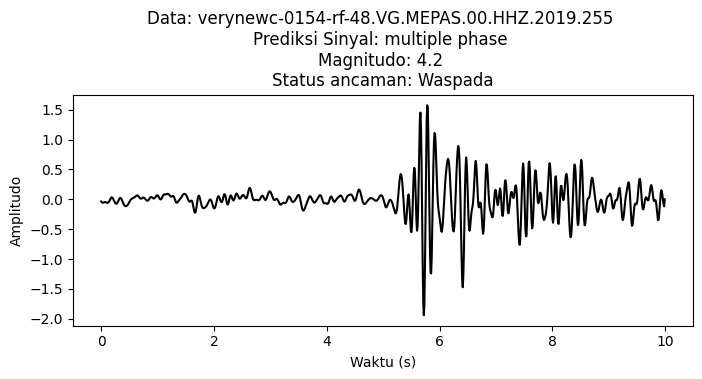

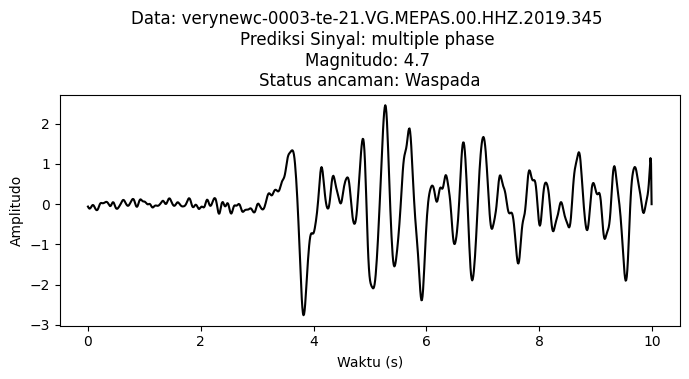

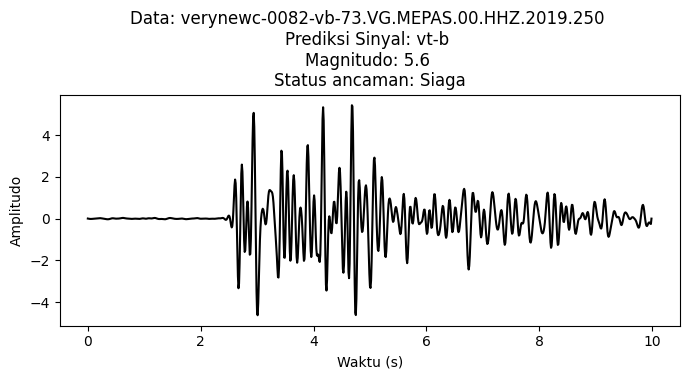

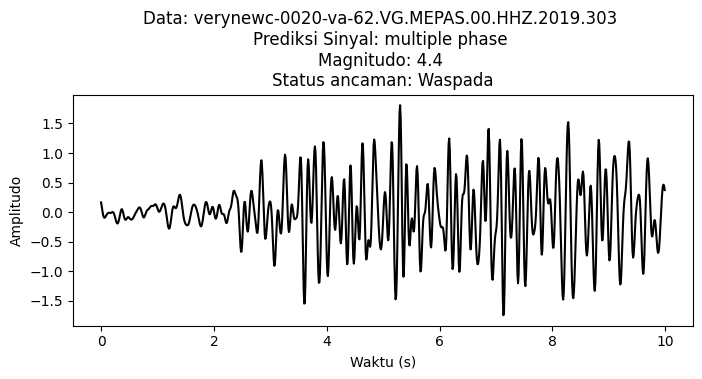

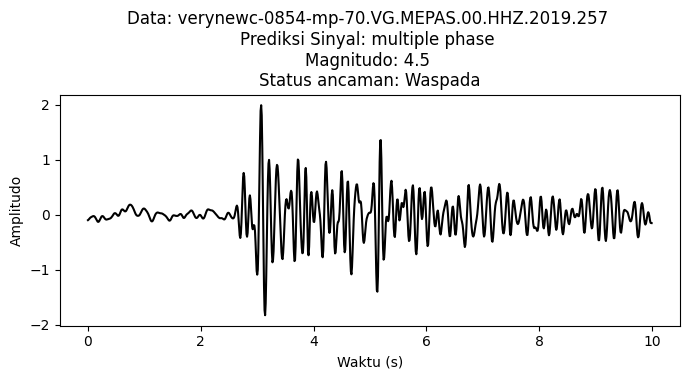

...

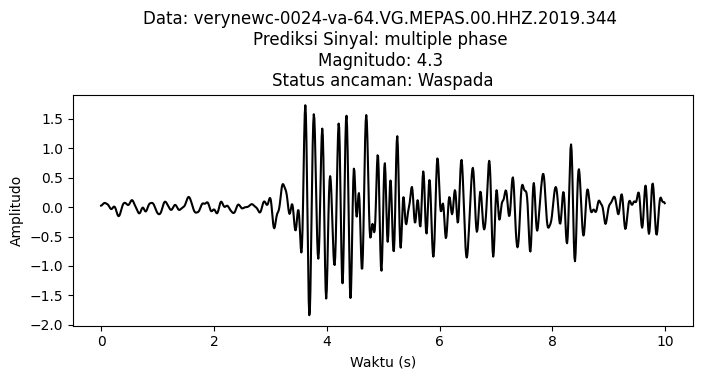

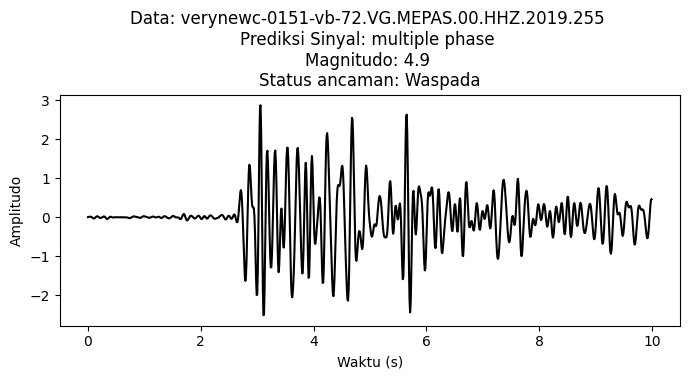

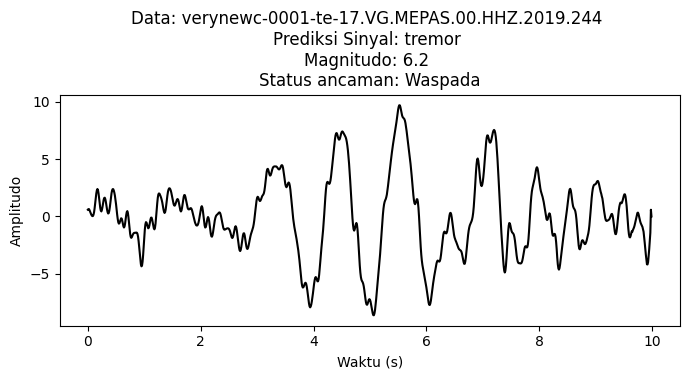

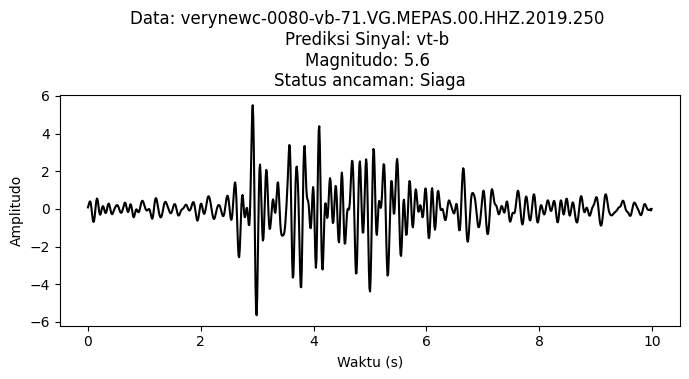

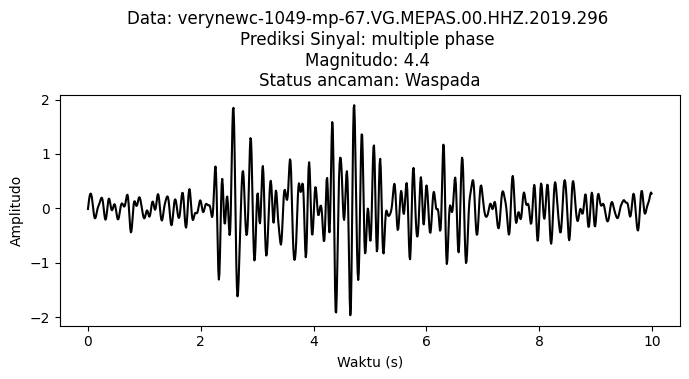

In [ ]:
from obspy.core.utcdatetime import  UTCDateTime
import os

data_spectrogram = np.zeros((variable['nx']*variable['ny'], jumlah), dtype=float)

dataset_prediksi = glob.glob("/content/data prediksi/dataset/*")
for i_data, cur_data in enumerate(dataset_prediksi):
    basename_data = os.path.basename(cur_data)
    seismic_data = read(cur_data)
    data_predict, time, point_predict = signal.spectrogram(seismic_data[0].data, int(1./delta_t),
                                                           scaling='spectrum',
                                                           nfft=variable['nfft'],
                                                           nperseg=nperseg,
                                                           noverlap=int(.5*nperseg) #jumlah point yang overlap di tiap segment
                                                          )
    point_pred_y, point_pred_x = point_predict.shape
    spec = point_predict.flatten()
    # spec = np.pad(spec, (0,1), mode='constant')
    point_predict = spec.reshape(point_pred_y, point_pred_x)
    spec = point_predict.flatten()
    # print(spec)
    data_spectrogram[:, i_data] = spec


# apply trained svm model on data spectogram
data_pred = best_model.predict(data_spectrogram.T)
year = 2019

for i_data, cur_data in enumerate(dataset_prediksi):
  basename_data = os.path.basename(cur_data)
  seismic_data = read(cur_data)
  start = UTCDateTime(seismic_data[0].stats.starttime) # waktu awal event
  end = UTCDateTime(seismic_data[0].stats.endtime) # waktu akhir event

  if start.year == year and end.year == year:
    fmin = 1.0  # frekuensi bawah
    fmax = 20.0  # frekuensi atas
    max_amplitude = seismic_data[0].data.max()
    magnitude = (np.log10(max_amplitude) + 1.5) * 2.5

    if magnitude >=0 and magnitude <= 2:
      erupsi = "Normal"
    elif magnitude >= 3 and magnitude <=5:
      erupsi = "Waspada"
    elif magnitude > 5 and magnitude <= 6:
      erupsi = "Siaga"
    elif magnitude >= 7:
      erupsi = "Awas"

    label_pred = int(data_pred[i_data])


    title_str = "Data: {} \nPrediksi Sinyal: {} \nMagnitudo: {:.1f} \nStatus ancaman: {}".format(os.path.basename(cur_data), variable['label'][label_pred], magnitude, erupsi)

      # plot seismic data
    plt.figure(figsize=(8, 3))
    plt.plot(seismic_data[0].times(), seismic_data[0].data, 'k')
    plt.title(title_str)
    plt.xlabel("Waktu (s)")
    plt.ylabel("Amplitudo")
    plt.show()